# Exploration

In [62]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns  

from unidecode import unidecode


Dans le cadre du projet de segmentation, l'objectif principal est de segmenter la clientèle en différents groupes homogènes en fonction de leurs comportements d'achat. Pour ce faire, nous devons explorer et analyser plusieurs jeux de données

## Importation des 7 dataframes

In [63]:
Customers_df= pd.read_csv("Data/data_csv/olist_customers_dataset.csv")
Geoloc_df = pd.read_csv("Data/data_csv/olist_geolocation_dataset.csv")
Order_items_df = pd.read_csv("Data/data_csv/olist_order_items_dataset.csv")
Order_payments_df = pd.read_csv("Data/data_csv/olist_Order_payments_dataset.csv")
Order_revews_df =pd.read_csv("Data/data_csv/olist_Order_reviews_dataset.csv")
Orders_df =pd.read_csv("Data/data_csv/olist_Orders_dataset.csv")
Product_df =pd.read_csv("Data/data_csv/olist_Products_dataset.csv")
Sellers_df =pd.read_csv("Data/data_csv/olist_Sellers_dataset.csv")
Product_cat_df =pd.read_csv("Data/data_csv/product_category_name_translation.csv")

### premiere observations des differents DF

In [64]:
print("nombre de ligne dans Customers_df",Customers_df.shape[0])
print("nombre de unique id dans Customers_df",Customers_df['customer_unique_id'].nunique())
print("nombre de ligne dans Product_df",Product_df.shape)
print("nombre de ligne dans order_payments_df",Order_payments_df.shape[0])
print("nombre de ligne dans orders_df",Orders_df.shape[0])
print("nombre de ligne dans orders_items_df",Order_items_df.shape[0])
print("nombre de ligne dans orders_review_df",Order_revews_df.shape[0])
print("nombre de ligne dans sellers_df",Sellers_df.shape[0])
print("nombre de ligne dans Product_catw_df",Product_cat_df.shape[0])
print("nombre de ligne dans geoloc",Geoloc_df.shape[0])
print("Nombre de valeur unique dans geoloc",Geoloc_df['geolocation_city'].nunique())

nombre de ligne dans Customers_df 99441
nombre de unique id dans Customers_df 96096
nombre de ligne dans Product_df (32951, 9)
nombre de ligne dans order_payments_df 103886
nombre de ligne dans orders_df 99441
nombre de ligne dans orders_items_df 112650
nombre de ligne dans orders_review_df 99224
nombre de ligne dans sellers_df 3095
nombre de ligne dans Product_catw_df 71
nombre de ligne dans geoloc 1000163
Nombre de valeur unique dans geoloc 8011


Il y a 8011 villes differente hors au bresils (d'apres wkipidia il y à 5570 municipalité). 

In [65]:
from unidecode import unidecode

def remove_accents(df, column_name):
    '''Supprime les accents des valeurs d'une colonne spécifique d'un DataFrame.

    Args:
        df (pandas.DataFrame): Le DataFrame contenant la colonne.
        nom_colonne (str): Le nom de la colonne à partir de laquelle supprimer les accents.

    Returns:
        pandas.DataFrame: Le DataFrame avec les accents supprimés de la colonne spécifiée.
    '''
    df[column_name] = df[column_name].apply(lambda x: unidecode(str(x)))
    return df


In [ ]:
# Dataset Geolocation: suppresion des accents et des doublons
remove_accents(Geoloc_df, "geolocation_city")

Geoloc_df.drop_duplicates(inplace=True)
print("Nombre de valeur unique dans geoloc_city",Geoloc_df['geolocation_city'].nunique())
# exportation pour la base de données SQL
#Geoloc_df.to_csv('/Users/bahia/Desktop/MLE_P4/geolocation2.csv', index=False)

Nombre de valeur unique dans geoloc_city 5969


In [ ]:
display(" Customers_df",Customers_df.head(), "Shape de Customers_df",Customers_df.shape)
display(" Product_df",Product_df.head())
display(" order_payments_df",Order_payments_df.head())
display(" orders_df",Orders_df.head())
display(" orders_items_df",Order_items_df.head())
display(" orders_review_df",Order_revews_df.head())
display(" sellers_df",Sellers_df.head())
display(" Product_cat_df",Product_cat_df.head())
display(" Geolocation_df",Geoloc_df.head())

' Customers_df'

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


'Shape de Customers_df'

(99441, 5)

' Product_df'

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


' order_payments_df'

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


' orders_df'

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


' orders_items_df'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


' orders_review_df'

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


' sellers_df'

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


' Product_cat_df'

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


' Geolocation_df'

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


Etant donner que chaque Df a une clé etrangere, on va pouvoir les lié entre eux pour ne garder qu'un seul DataFrame. Comme on peut le voir sur l'image si dessous. (source : kaggle)

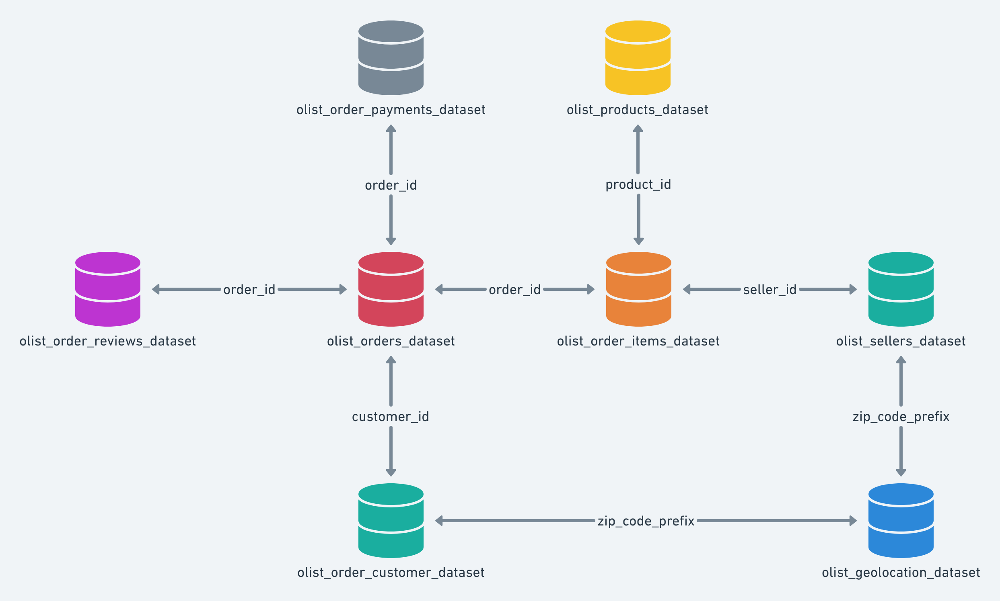 

In [ ]:
#Suppression des accents dans les colonnes review_comment_message et review_comment_title
def remove_accents(df, column_name):
    df[column_name] = df[column_name].apply(lambda x: unidecode(str(x)))
    return df

remove_accents(Order_revews_df, "review_comment_message")
remove_accents(Order_revews_df, "review_comment_title")
order_revieww = Order_revews_df.drop(['review_comment_message'],axis=1)
#order_revieww.to_csv('/Users/bahia/Desktop/tables Sql/order_revieww.csv', index=False)


In [ ]:
# Fonction pour vérifier si les colonnes contiennent des valeurs manquantes
def num_missing(df):
    return sum(df.isnull())


In [ ]:
df=pd.merge(Customers_df, Orders_df, on='customer_id', how='left')
df=pd.merge(df, Order_items_df, on='order_id', how='left')
df = pd.merge(df, Product_df, on='product_id', how='left')
df = pd.merge(df, Order_payments_df, on='order_id', how='left')
df = pd.merge(df, Sellers_df, on='seller_id', how='inner')
df=pd.merge(df, Order_revews_df, on='order_id')
df = pd.merge(df, Product_cat_df, on='product_category_name', how='left')
df.shape

(117332, 40)

In [ ]:
print(df.order_status.value_counts())
df = df[df.order_status == 'delivered']
print(df.order_status.value_counts())

order_status
delivered      114862
shipped          1167
canceled          553
invoiced          370
processing        370
unavailable         7
approved            3
Name: count, dtype: int64
order_status
delivered    114862
Name: count, dtype: int64


Il y a plusieurs status de commande different. Pour cette analyse nous nous concentrerons sur les commandes qui ont été livré

## Aggregation pour obtenir un maillage de une ligne par client.

,customer_id
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,1
0000b849f77a49e4a4ce2b2a4ca5be3f,1
0000f46a3911fa3c0805444483337064,1
0000f6ccb0745a6a4b88665a16c9f078,1
0004aac84e0df4da2b147fca70cf8255,1
...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1
fffea47cd6d3cc0a88bd621562a9d061,1
ffff371b4d645b6ecea244b27531430a,1


le nombre de valeur identifiant unique :  96096 Shape de nbr_visite (96096, 1)


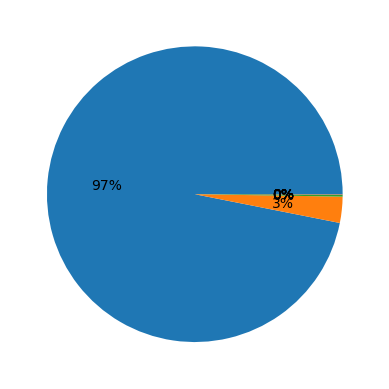

In [ ]:
nbr_visite = Customers_df[['customer_unique_id','customer_id']].groupby(['customer_unique_id']).count()
display( nbr_visite)
print("le nombre de valeur identifiant unique : ",nbr_visite.index.nunique(),
      "Shape de nbr_visite",nbr_visite.shape)
plt.pie(nbr_visite['customer_id'].value_counts(), autopct='%1.0f%%')
plt.show()

Seul 3% des clients on effectuer plus de une visite (conclu par un achat)

le nombre de valeur identifiant unique :  92755 Shape de nbr_visite (92755, 1)


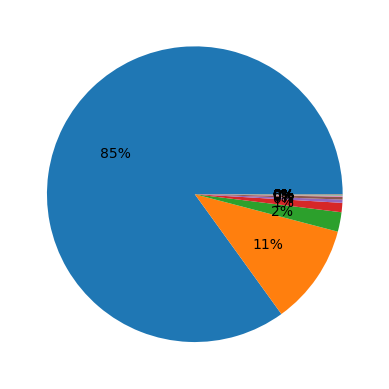

In [ ]:
nbr_visite = df[['customer_unique_id','customer_id']].groupby(['customer_unique_id']).count()
#display( nbr_visite)
print("le nombre de valeur identifiant unique : ",nbr_visite.index.nunique(),
      "Shape de nbr_visite",nbr_visite.shape)
plt.pie(nbr_visite['customer_id'].value_counts(), autopct='%1.0f%%')
plt.show()

In [ ]:
print("Missing values:")
print(df.apply(num_missing, axis=0))

Missing values:
customer_id                         0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
order_id                            0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date        2
order_delivered_customer_date       8
order_estimated_delivery_date       0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_category_name            1626
product_name_lenght              1626
product_description_lenght       1626
product_photos_qty               1626
product_weight_g                   20
product_length_cm                  20
product_height_cm                  20
product_width_cm                  

<Axes: >

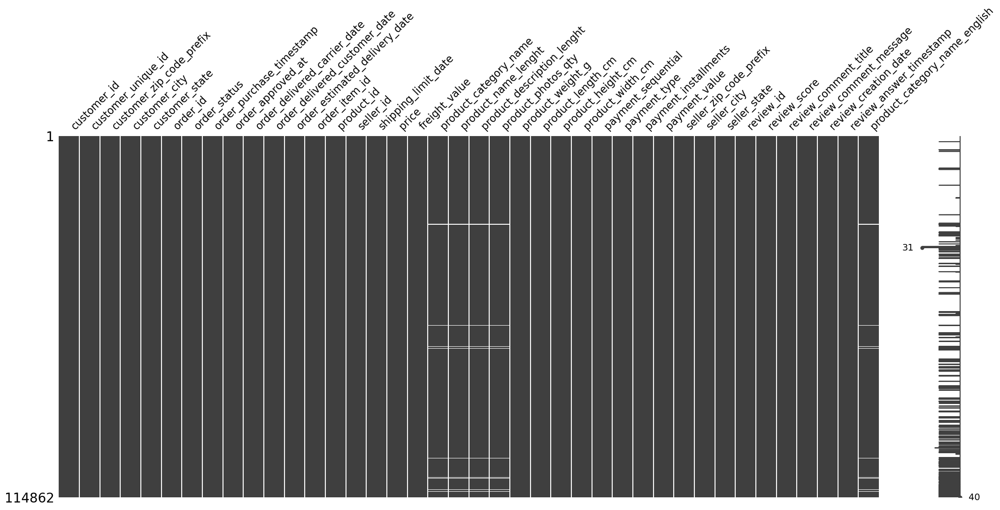

In [ ]:
msno.matrix(df)

In [ ]:
df['customer_unique_id'].nunique()

92755

In [ ]:
df.head(1)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,8577,itaquaquecetuba,SP,88b8b52d46df026a9d1ad2136a59b30b,4,nan,nan,2017-05-26 00:00:00,2017-05-30 22:34:40,office_furniture


# Nettoyage

## Valeurs manquantes:


In [ ]:
df['review_comment_message'].fillna("no comment", inplace=True)
df =df.drop(['review_comment_title'],axis=1)

df = df.dropna()
print(df.shape)


(113186, 39)


In [ ]:
 # achat moyen 
    
achat_moy = df[['customer_unique_id','price']].groupby(['customer_unique_id']).mean()
achat_moy = achat_moy.rename(columns = {'price': 'achat_moy'})
achat_moy = achat_moy.reset_index()
print("le nombre de valeur identifiant unique : ",achat_moy['customer_unique_id'].nunique())

le nombre de valeur identifiant unique :  91459


## Features engineering

In [ ]:
# Formatter correstement les date
date_cols = ['order_purchase_timestamp',
    'order_approved_at',
    'order_delivered_carrier_date',
    'order_delivered_customer_date',
    'order_estimated_delivery_date']


df[date_cols] = df[date_cols].apply(pd.to_datetime)

In [ ]:
# On supprime les commande annulés
print(df.order_status.value_counts())
df = df[df.order_status == 'delivered']

order_status
delivered    113186
Name: count, dtype: int64


In [ ]:
print("Date du dernier achat", df.order_purchase_timestamp.max())
print("Date du premier achat", df.order_purchase_timestamp.min())


Date du dernier achat 2018-08-29 15:00:37
Date du premier achat 2016-10-03 09:44:50


In [ ]:
 # achat moyen 
    
cart_mean = df[['customer_unique_id','price']].groupby(['customer_unique_id']).mean()
cart_mean = cart_mean.rename(columns = {'price': 'cart_mean'})
cart_mean = cart_mean.reset_index()
print("le nombre de valeur identifiant unique : ",cart_mean['customer_unique_id'].nunique())
display(cart_mean[:10])
print("le nombre de valeur identifiant unique : ",df['customer_unique_id'].nunique())

le nombre de valeur identifiant unique :  91459


,customer_unique_id,cart_mean
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90
2,0000f46a3911fa3c0805444483337064,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,25.99
4,0004aac84e0df4da2b147fca70cf8255,180.00
5,0004bd2a26a76fe21f786e4fbd80607f,154.00
6,00050ab1314c0e55a6ca13cf7181fecf,27.99
7,00053a61a98854899e70ed204dd4bafe,191.00
8,0005e1862207bf6ccc02e4228effd9a0,135.00
9,0005ef4cd20d2893f0d9fbd94d3c0d97,104.90


le nombre de valeur identifiant unique :  91459


In [ ]:
#Achat total
total_purchase_value = df[['customer_unique_id','price']].groupby(['customer_unique_id']).sum()
total_purchase_value = total_purchase_value.rename(columns = {'price': 'total_purchase_value'})
total_purchase_value = total_purchase_value.reset_index()
print("le nombre de valeur identifiant unique : ",total_purchase_value['customer_unique_id'].nunique())
display(total_purchase_value.head())

le nombre de valeur identifiant unique :  91459


,customer_unique_id,total_purchase_value
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90
2,0000f46a3911fa3c0805444483337064,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,25.99
4,0004aac84e0df4da2b147fca70cf8255,180.00


In [ ]:
nbr_visite = Customers_df[['customer_unique_id','customer_id']].groupby(['customer_unique_id']).count()
display( nbr_visite)
print("le nombre de valeur identifiant unique : ",nbr_visite.index.nunique(),
      "Shape de nbr_visite",nbr_visite.shape)


,customer_id
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,1
0000b849f77a49e4a4ce2b2a4ca5be3f,1
0000f46a3911fa3c0805444483337064,1
0000f6ccb0745a6a4b88665a16c9f078,1
0004aac84e0df4da2b147fca70cf8255,1
...,...
fffcf5a5ff07b0908bd4e2dbc735a684,1
fffea47cd6d3cc0a88bd621562a9d061,1
ffff371b4d645b6ecea244b27531430a,1


le nombre de valeur identifiant unique :  96096 Shape de nbr_visite (96096, 1)


dans le dataset Customer seul 3% des clients on effectué plus de 1 commande
il y a 96096 identifiant unique 

le nombre de valeur identifiant unique :  91459 Shape de Nbr_items_by_customer (91459, 2)


,customer_unique_id,customer_id
7,00053a61a98854899e70ed204dd4bafe,2
15,000bfa1d2f1a41876493be685390d6d3,2
18,000de6019bb59f34c099a907c151d855,2
19,000e309254ab1fc5ba99dd469d36bdb4,2
22,000fbf0473c10fc1ab6f8d2d286ce20c,4


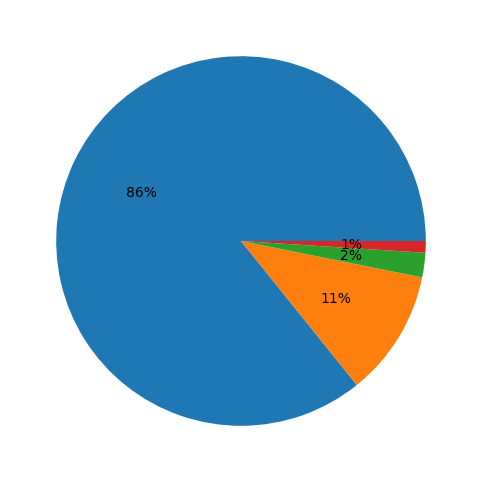

In [ ]:
# nombre d'achat
    
Nbr_items_by_customer = df[['customer_unique_id','customer_id']].groupby(['customer_unique_id']).count()
Nbr_items_by_customer = Nbr_items_by_customer.rename(columns = {'product_id': 'Nbr_items_by_customer'})
Nbr_items_by_customer = Nbr_items_by_customer.reset_index()
print("le nombre de valeur identifiant unique : ",Nbr_items_by_customer['customer_unique_id'].nunique(),
      "Shape de Nbr_items_by_customer",Nbr_items_by_customer.shape)
display(Nbr_items_by_customer.loc[Nbr_items_by_customer['customer_id'] > 1].head())
plt.figure(figsize=(8,6))
plt.pie(Nbr_items_by_customer['customer_id'].value_counts()[:4], autopct='%1.0f%%')
plt.show()



In [ ]:

#type de paiment
    
type_de_paiment = df[['customer_unique_id','payment_type']].groupby([
    'customer_unique_id'])['payment_type'].apply(lambda x: x.mode()[0])
type_de_paiment = pd.DataFrame(type_de_paiment)
type_de_paiment = type_de_paiment.reset_index()
print("le nombre de valeur identifiant unique : ",type_de_paiment['customer_unique_id'].nunique())
display(type_de_paiment[:10])

le nombre de valeur identifiant unique :  91459


,customer_unique_id,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,credit_card
1,0000b849f77a49e4a4ce2b2a4ca5be3f,credit_card
2,0000f46a3911fa3c0805444483337064,credit_card
3,0000f6ccb0745a6a4b88665a16c9f078,credit_card
4,0004aac84e0df4da2b147fca70cf8255,credit_card
5,0004bd2a26a76fe21f786e4fbd80607f,credit_card
6,00050ab1314c0e55a6ca13cf7181fecf,boleto
7,00053a61a98854899e70ed204dd4bafe,credit_card
8,0005e1862207bf6ccc02e4228effd9a0,credit_card
9,0005ef4cd20d2893f0d9fbd94d3c0d97,credit_card


In [ ]:
 
# note moyenne 

note_moyenne = df[['customer_unique_id','review_score']].groupby(['customer_unique_id']).mean()
note_moyenne = note_moyenne.rename(columns = {'review_score': 'note'})
note_moyenne = note_moyenne.reset_index()
print("le nombre de valeur identifiant unique : ",note_moyenne['customer_unique_id'].nunique())

le nombre de valeur identifiant unique :  91459


In [ ]:
    # les villes où l'on achete 
ville = df[['customer_unique_id','customer_city']].groupby([
    'customer_unique_id'])['customer_city'].apply(lambda x: x.mode()[0])
ville = pd.DataFrame(ville)
ville = ville.reset_index()
print("le nombre de valeur identifiant unique : ",ville['customer_unique_id'].nunique())
#print(ville.shape)
display(ville[:10])


le nombre de valeur identifiant unique :  91459


,customer_unique_id,customer_city
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco
2,0000f46a3911fa3c0805444483337064,sao jose
3,0000f6ccb0745a6a4b88665a16c9f078,belem
4,0004aac84e0df4da2b147fca70cf8255,sorocaba
5,0004bd2a26a76fe21f786e4fbd80607f,sao paulo
6,00050ab1314c0e55a6ca13cf7181fecf,campinas
7,00053a61a98854899e70ed204dd4bafe,curitiba
8,0005e1862207bf6ccc02e4228effd9a0,teresopolis
9,0005ef4cd20d2893f0d9fbd94d3c0d97,sao luis


In [ ]:
df_order_time = df.groupby('customer_unique_id')['order_purchase_timestamp'].max()
df_order_time = pd.DataFrame(df_order_time)
df_order_time = df_order_time.reset_index()
print("le nombre de valeur identifiant unique : ",df_order_time['customer_unique_id'].nunique())
display(df_order_time.head())

le nombre de valeur identifiant unique :  91459


,customer_unique_id,order_purchase_timestamp
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42


In [ ]:
state = df[['customer_unique_id','customer_state']].groupby([
    'customer_unique_id'])['customer_state'].apply(lambda x: x.mode()[0])
state = pd.DataFrame(state)
state = state.reset_index()
print("le nombre de valeur identifiant unique : ",state['customer_unique_id'].nunique())
#print(state.shape)
display(state[:10])

le nombre de valeur identifiant unique :  91459


,customer_unique_id,customer_state
0,0000366f3b9a7992bf8c76cfdf3221e2,SP
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP
2,0000f46a3911fa3c0805444483337064,SC
3,0000f6ccb0745a6a4b88665a16c9f078,PA
4,0004aac84e0df4da2b147fca70cf8255,SP
5,0004bd2a26a76fe21f786e4fbd80607f,SP
6,00050ab1314c0e55a6ca13cf7181fecf,SP
7,00053a61a98854899e70ed204dd4bafe,PR
8,0005e1862207bf6ccc02e4228effd9a0,RJ
9,0005ef4cd20d2893f0d9fbd94d3c0d97,MA


In [ ]:
## produit le plus acheté 
produit_le_plus_acheté = df.groupby('customer_unique_id')['product_category_name'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

produit_le_plus_acheté = produit_le_plus_acheté.reset_index()
print("Le nombre de valeurs uniques d'identifiant client : ", produit_le_plus_acheté['customer_unique_id'].nunique())


Le nombre de valeurs uniques d'identifiant client :  91459


In [ ]:
   # delais de la commande 
last_purchase = df[['customer_unique_id','order_purchase_timestamp','order_delivered_customer_date']].groupby([
'customer_unique_id']).head(5)
last_purchase['order_purchase_timestamp'] = last_purchase['order_purchase_timestamp'].max() - last_purchase['order_purchase_timestamp']

last_purchase =last_purchase.drop(['order_delivered_customer_date'],axis=1)
last_purchase.rename(columns={"order_purchase_timestamp": "last_purchase"}, inplace=True)

print("le nombre de valeur identifiant unique : ",last_purchase['customer_unique_id'].nunique())
display(last_purchase[:10])


le nombre de valeur identifiant unique :  91459


,customer_unique_id,last_purchase
0,861eff4711a542e4b93843c6dd7febb0,469 days 23:55:02
1,060e732b5b29e8181a18229c7b0b2b5e,101 days 22:52:52
2,259dac757896d24d7702b9acbbff3f3c,168 days 22:53:59
3,07d190f123147d9e89d4b922543d7948,52 days 05:01:18
4,332cf4e83e16004ba7dca932ce82475b,513 days 16:45:10
5,be4656d02bf1e9d6663764ac9c7909ef,424 days 05:16:48
6,4669d94e1e35f2493af76862ff85beba,65 days 20:58:03
7,ff80f08b2a6a87e84a28bda4613f99bf,273 days 22:45:33
8,c1c7632732a487b1221e7bfb627c575f,396 days 18:35:25
9,c1c7632732a487b1221e7bfb627c575f,396 days 18:35:25


In [ ]:
product_type = df.groupby(['product_category_name_english']).count().sort_values(
    by='customer_id', ascending=False)['customer_id']
display(product_type)


product_category_name_english
bed_bath_table               11684
health_beauty                 9747
sports_leisure                8733
furniture_decor               8554
computers_accessories         7926
                             ...  
arts_and_craftmanship           24
la_cuisine                      15
cds_dvds_musicals               14
fashion_childrens_clothes        7
security_and_services            2
Name: customer_id, Length: 71, dtype: int64

In [ ]:
# Reduction du nombre de catégorie de produit
product_categories_dict = {
    'construction_tools_construction': 'construction',
    'construction_tools_lights': 'construction',
    'construction_tools_safety': 'construction',
    'costruction_tools_garden': 'construction',
    'costruction_tools_tools': 'construction',
    'garden_tools': 'construction',
    'home_construction': 'construction',

    'fashio_female_clothing': 'fashion',
    'fashion_bags_accessories': 'fashion',
    'fashion_childrens_clothes': 'fashion',
    'fashion_male_clothing': 'fashion',
    'fashion_shoes': 'fashion',
    'fashion_sport': 'fashion',
    'fashion_underwear_beach': 'fashion',

    'furniture_bedroom': 'furniture',
    'furniture_decor': 'furniture',
    'furniture_living_room': 'furniture',
    'furniture_mattress_and_upholstery': 'furniture',
    'bed_bath_table': 'furniture',
    'kitchen_dining_laundry_garden_furniture': 'furniture',
    'office_furniture': 'furniture',

    'home_appliances': 'home',
    'home_appliances_2': 'home',
    'home_comfort_2': 'home',
    'home_confort': 'home',
    'air_conditioning': 'home',
    'housewares': 'home',
    'art': 'home',
    'arts_and_craftmanship': 'home',
    'flowers': 'home',
    'cool_stuff': 'home',

    'drinks': 'food_drink',
    'food': 'food_drink',
    'food_drink': 'food_drink',
    'la_cuisine': 'food_drink',

    'electronics': 'electronics',
    'audio': 'electronics',
    'tablets_printing_image': 'electronics',
    'telephony': 'electronics',
    'fixed_telephony': 'electronics',
    'small_appliances': 'electronics',
    'small_appliances_home_oven_and_coffee': 'electronics',
    'computers_accessories': 'electronics',
    'computers': 'electronics',}

df['product_category_name_english'] = df['product_category_name_english'].replace(product_categories_dict)


In [ ]:
product_type = df.groupby(['product_category_name_english']).count().sort_values(
    by='customer_id', ascending=False)['customer_id']
display(product_type)


product_category_name_english
furniture                         22948
electronics                       16978
home                              13155
health_beauty                      9747
sports_leisure                     8733
construction                       6840
watches_gifts                      6030
auto                               4259
toys                               4160
perfumery                          3495
baby                               3095
fashion                            2741
stationery                         2557
pet_shop                           1998
food_drink                         1170
luggage_accessories                1144
consoles_games                     1130
musical_instruments                 682
books_general_interest              544
market_place                        323
books_technical                     267
industry_commerce_and_business      265
agro_industry_and_commerce          246
signaling_and_security              198
christmas_

In [ ]:
# Merge des differentes colonne créer
df_f = Nbr_items_by_customer.merge(achat_moy)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(total_purchase_value)
print(df_f['customer_unique_id'].nunique())


df_f = df_f.merge(note_moyenne)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(type_de_paiment)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(ville)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(state)
print(df_f['customer_unique_id'].nunique())

df_f= df_f.merge(df_order_time)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(produit_le_plus_acheté)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(last_purchase)
print(df_f['customer_unique_id'].nunique())

df_f = df_f.merge(total_purchase_value)
print(df_f['customer_unique_id'].nunique())
df_f = df_f.drop_duplicates(subset=['customer_unique_id'])
print(df_f.shape)


91459
91459
91459
91459
91459
91459
91459
91459
91459
91459
(91459, 11)


# Exploration

In [ ]:
display(df_f)
display(df_f.describe())

,customer_unique_id,customer_id,achat_moy,total_purchase_value,note,payment_type,customer_city,customer_state,order_purchase_timestamp,product_category_name,last_purchase
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,129.90,5.0,credit_card,cajamar,SP,2018-05-10 10:56:27,cama_mesa_banho,111 days 04:04:10
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,18.90,4.0,credit_card,osasco,SP,2018-05-07 11:11:27,beleza_saude,114 days 03:49:10
2,0000f46a3911fa3c0805444483337064,1,69.00,69.00,3.0,credit_card,sao jose,SC,2017-03-10 21:05:03,papelaria,536 days 17:55:34
3,0000f6ccb0745a6a4b88665a16c9f078,1,25.99,25.99,4.0,credit_card,belem,PA,2017-10-12 20:29:41,telefonia,320 days 18:30:56
4,0004aac84e0df4da2b147fca70cf8255,1,180.00,180.00,5.0,credit_card,sorocaba,SP,2017-11-14 19:45:42,telefonia,287 days 19:14:55
...,...,...,...,...,...,...,...,...,...,...,...
111526,fffcf5a5ff07b0908bd4e2dbc735a684,2,785.00,1570.00,5.0,credit_card,sanharo,PE,2017-06-08 21:00:36,beleza_saude,446 days 18:00:01
111528,fffea47cd6d3cc0a88bd621562a9d061,1,64.89,64.89,4.0,credit_card,feira de santana,BA,2017-12-10 20:07:56,bebes,261 days 18:52:41
111529,ffff371b4d645b6ecea244b27531430a,1,89.90,89.90,5.0,credit_card,sinop,MT,2017-02-07 15:49:16,automotivo,567 days 23:11:21
111530,ffff5962728ec6157033ef9805bacc48,1,115.00,115.00,5.0,credit_card,bom jesus do norte,ES,2018-05-02 15:17:41,relogios_presentes,118 days 23:42:56


,customer_id,achat_moy,total_purchase_value,note,order_purchase_timestamp,last_purchase
count,91459.000000,91459.000000,91459.000000,91459.000000,91459,91459
mean,1.237560,125.669969,148.319528,4.154727,2018-01-05 00:43:14.930449664,237 days 22:45:47.278179292
min,1.000000,0.850000,0.850000,1.000000,2016-10-03 16:56:50,0 days 00:00:00
25%,1.000000,42.900000,48.900000,4.000000,2017-09-18 17:33:48,113 days 23:03:22.500000
50%,1.000000,79.000000,89.900000,5.000000,2018-01-24 00:56:44,218 days 19:56:26
75%,1.000000,139.900000,159.900000,5.000000,2018-05-08 12:28:38.500000,347 days 02:41:30
max,75.000000,6735.000000,13440.000000,5.000000,2018-08-29 15:00:37,694 days 22:03:47
std,0.844406,188.662772,243.701977,1.279197,NaN,152 days 17:48:21.185952862


In [ ]:
df_order_time = df.groupby('customer_unique_id')['order_purchase_timestamp'].max()
display(df_order_time.head())


customer_unique_id
0000366f3b9a7992bf8c76cfdf3221e2   2018-05-10 10:56:27
0000b849f77a49e4a4ce2b2a4ca5be3f   2018-05-07 11:11:27
0000f46a3911fa3c0805444483337064   2017-03-10 21:05:03
0000f6ccb0745a6a4b88665a16c9f078   2017-10-12 20:29:41
0004aac84e0df4da2b147fca70cf8255   2017-11-14 19:45:42
Name: order_purchase_timestamp, dtype: datetime64[ns]

 ### Decomposition saisoniaire et tendance mensuel

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bahia/opt/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



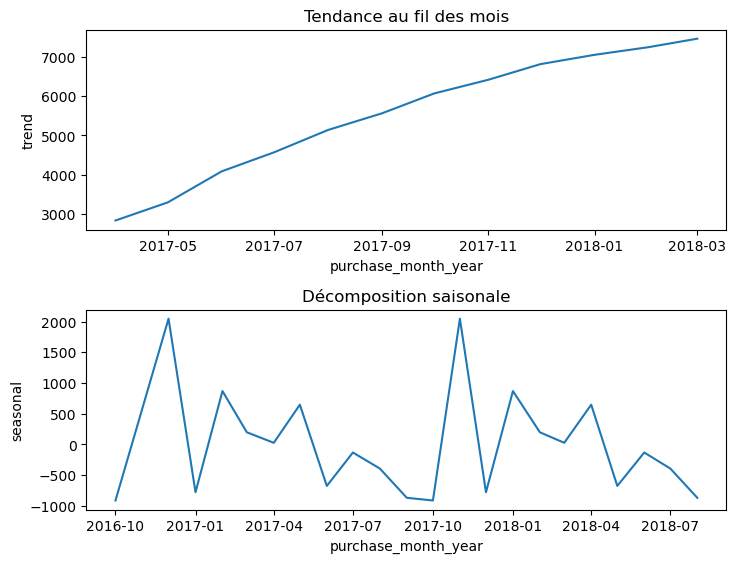

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose


# Convertir la date en periode mensuelle
df['purchase_month_year'] = df['order_purchase_timestamp'].dt.to_period('M')
# Grouper par mois et compter le nombre de commande
period_decompose = df.groupby('purchase_month_year').size()
period_decompose.index = period_decompose.index.astype('datetime64[ns]')
period_decompose.sort_index(inplace = True)

# Decomposition saisoniere
result = seasonal_decompose(period_decompose, model='additive', period= 11)


fig, ax = plt.subplots(2,1,figsize=(8,6))

sns.lineplot(data=result.trend, x=result.trend.index, y=result.trend, ax=ax[0])
sns.lineplot(data=result.seasonal, x=result.seasonal.index, y=result.seasonal, ax=ax[1])

plt.tight_layout()
ax[0].title.set_text('Tendance au fil des mois')

ax[1].title.set_text('Décomposition saisonale')
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
plt.show()


La tendance est à l'augmentation constante.  
On peut observer deux pics de commandes décembre 2016 et en novembre 2017.  
Les période creuse est fin aout, pour 2017 et 2018.  

In [ ]:
import plotly.express as px

## visualisation sur les differentes données

### Recence

In [ ]:
# Observation de la recence
fig = px.histogram(df_f.last_purchase, nbins=24, title="Histogramme de la récence (jours)")
fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.update_layout(showlegend=False)


In [ ]:
# Observation de la recence popur les client qui ont effectuer plus de 1 achat
fig = px.histogram(df_f[df_f.customer_id > 1 ].last_purchase,nbins=24,
             title = "Histogramme de la récence pour les clients multiple")

fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.update_layout(showlegend=False)


Sur ces histogrammes, nous observons la récence d'achat des clients, c'est-à-dire le temps écoulé depuis leur dernier achat. On observe que la majorité des clients ont effectué leur dernier achat il y a moins d'un an, indiquant une activité récente et continue.
La tendance reste similaire entre les clients ayant efféctué plusieur achat et ceux n'en n'ayant effectué qu'un seul.



### Note

In [ ]:

fig = px.histogram(df_f.note, nbins=5, title="Histogramme de la note moyenne")
fig.update_traces(marker=dict(line=dict(color='black', width=1)) )
fig.update_layout(showlegend=False, width=600, height=400)


In [ ]:
quantile_note = df_f.note.quantile([0,0.25,0.5,0.75,1])
quantile_note

fig = px.box(df_f, x="note", title="Boxplot de la note moyenne")
fig.update_layout(showlegend=False, width=700, height=500)
fig.add_annotation(text="min" + ": " + str(quantile_note.iloc[0]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.4, showarrow=False)
fig.add_annotation(text="q1" + ": " + str(quantile_note.iloc[1]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.4, showarrow=False)
fig.add_annotation(text="med" + ":" + str(quantile_note.iloc[2]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.3, showarrow=False)
fig.add_annotation(text="q3" + ":" + str(quantile_note.iloc[3]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.2, showarrow=False)
fig.add_annotation(text="max" + ":" + str(quantile_note.iloc[4]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.3, showarrow=False)
fig.show()


D'après les observations du boxplot sur les dépenses moyennes par client, on peut constater que :  

La médiane des dépenses moyennes par client s'élève à 79.9 Real.  
Une grande variabilité est observée dans les montants dépensés par les clients, avec une différence notable entre le premier quartile, où les dépenses moyennes sont de 42.9 Real, et le troisième quartile, où elles sont de 139.9 Real.  

Bien que la plupart des clients aient des dépenses moyennes relativement modestes, on remarque également la présence de transactions à des valeurs très élevées, comme en témoigne le maximum de 6735 Real.  

Ces observations indiquent une diversité dans les habitudes de dépenses des clients, avec certains préférant des achats à faible coût tandis que d'autres investissent dans des achats plus importants.

### Montant des paniers

In [ ]:
quantile_pay_moy = df_f.achat_moy.quantile([0,0.25,0.5,0.75,1])
quantile_pay_moy

fig = px.box(df_f, x="achat_moy", title="Boxplot du panier moyen")
fig.update_layout(showlegend=True, width=700, height=500, boxmode="overlay")
fig.add_annotation(text="min" + ": " + str(quantile_pay_moy.iloc[0]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.4, showarrow=False)
fig.add_annotation(text="q1" + ": " + str(quantile_pay_moy.iloc[1]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.4, showarrow=False)
fig.add_annotation(text="med" + ":" + str(quantile_pay_moy.iloc[2]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.3, showarrow=False)
fig.add_annotation(text="q3" + ":" + str(quantile_pay_moy.iloc[3]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.2, showarrow=False)
fig.add_annotation(text="max" + ":" + str(quantile_pay_moy.iloc[4]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.3, showarrow=False)


fig.show()



In [ ]:
quantile_pay_tot = df_f.total_purchase_value.quantile([0,0.25,0.5,0.75,1])
display(quantile_pay_tot)
fig = px.box(df_f, x="achat_moy", title="Boxplot montant total des achats par client")
fig.update_layout(showlegend=True, width=700, height=500, boxmode="overlay")
fig.add_annotation(text="min" + ": " + str(quantile_pay_tot.iloc[0]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.4, showarrow=False)
fig.add_annotation(text="q1" + ": " + str(quantile_pay_tot.iloc[1]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.4, showarrow=False)
fig.add_annotation(text="med" + ":" + str(quantile_pay_tot.iloc[2]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.3, showarrow=False)
fig.add_annotation(text="q3" + ":" + str(quantile_pay_tot.iloc[3]),
                  xref="paper", yref="paper",
                  x=0.3, y=0.2, showarrow=False)
fig.add_annotation(text="max" + ":" + str(quantile_pay_tot.iloc[4]),
                  xref="paper", yref="paper",
                  x=0.1, y=0.3, showarrow=False)


fig.show()

0.00        0.85
0.25       48.90
0.50       89.90
0.75      159.90
1.00    13440.00
Name: total_purchase_value, dtype: float64

### Frequence

In [ ]:
# Obervatioin de la frequence d'achat
fig = px.histogram(df_f.customer_id, title="Histogramme de la frequence d'achat")
fig.update_traces(marker=dict(line=dict(color='black', width=1)))
fig.update_layout(showlegend=False, width=800, height=600)

In [ ]:
print("le df est de : ",df_f.shape)
print("le nombre de valeur manquantes: ", sum(df_f.isnull().values.ravel()))

le df est de :  (91459, 11)
le nombre de valeur manquantes:  0


In [ ]:
display(df[:1])
df.shape

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name_english,purchase_month_year
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,8577,itaquaquecetuba,SP,88b8b52d46df026a9d1ad2136a59b30b,4,nan,2017-05-26 00:00:00,2017-05-30 22:34:40,furniture,2017-05


(113186, 40)

customer_id
1     77725
2     10020
3      1940
4       923
5       325
6       284
7        67
8        45
12       25
9        24
10       24
11       17
14        9
24        7
15        6
13        4
20        3
21        3
16        1
18        1
19        1
22        1
26        1
35        1
38        1
75        1
Name: customer_unique_id, dtype: int64

<Axes: title={'center': 'Nombre de produit acheter par client'}, xlabel='customer_id'>

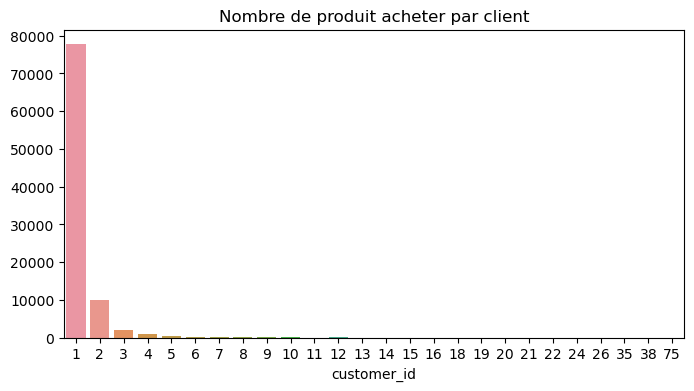

In [ ]:
items_by_customer = Nbr_items_by_customer.groupby(['customer_id']).count().sort_values(
    by='customer_unique_id', ascending=False)['customer_unique_id']
display(items_by_customer)
plt.figure(figsize=(8,4))
plt.title('Nombre de produit acheter par client')
sns.barplot(y = items_by_customer.values,
           x = items_by_customer.index)

### Nombre d'achat par etats

customer_state
SP    47810
RJ    14563
MG    13215
RS     6310
PR     5790
SC     4142
BA     3844
DF     2397
GO     2305
ES     2268
PE     1795
CE     1480
MT     1060
PA     1056
MS      837
MA      807
PB      605
RN      553
PI      541
AL      438
SE      382
TO      329
RO      274
AM      167
AC       92
AP       82
RR       44
Name: customer_city, dtype: int64

<Axes: title={'center': ' les etats avec le plus de client'}, xlabel='customer_state'>

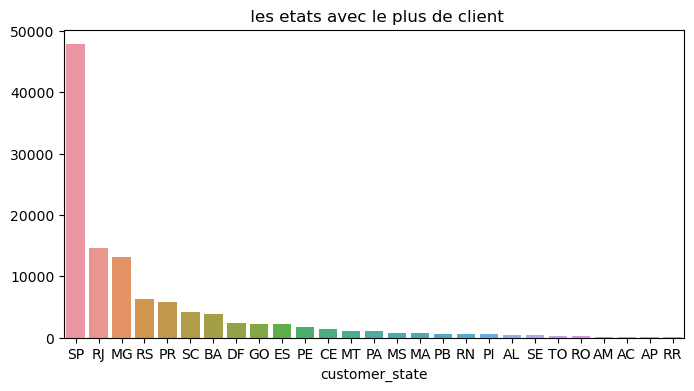

In [ ]:
purchase_by_state = df.groupby(['customer_state']).count().sort_values(
    by='customer_city', ascending=False)['customer_city']

display(purchase_by_state)
plt.figure(figsize=(8,4))
plt.title(' les etats avec le plus de client')
sns.barplot(y = purchase_by_state.values,
           x = purchase_by_state.index)

product_category_name_english
furniture                         22948
electronics                       16978
home                              13155
health_beauty                      9747
sports_leisure                     8733
construction                       6840
watches_gifts                      6030
auto                               4259
toys                               4160
perfumery                          3495
baby                               3095
fashion                            2741
stationery                         2557
pet_shop                           1998
food_drink                         1170
luggage_accessories                1144
consoles_games                     1130
musical_instruments                 682
books_general_interest              544
market_place                        323
books_technical                     267
industry_commerce_and_business      265
agro_industry_and_commerce          246
signaling_and_security              198
christmas_

<Axes: title={'center': " Nombre d'achat par categorie"}, ylabel='product_category_name_english'>

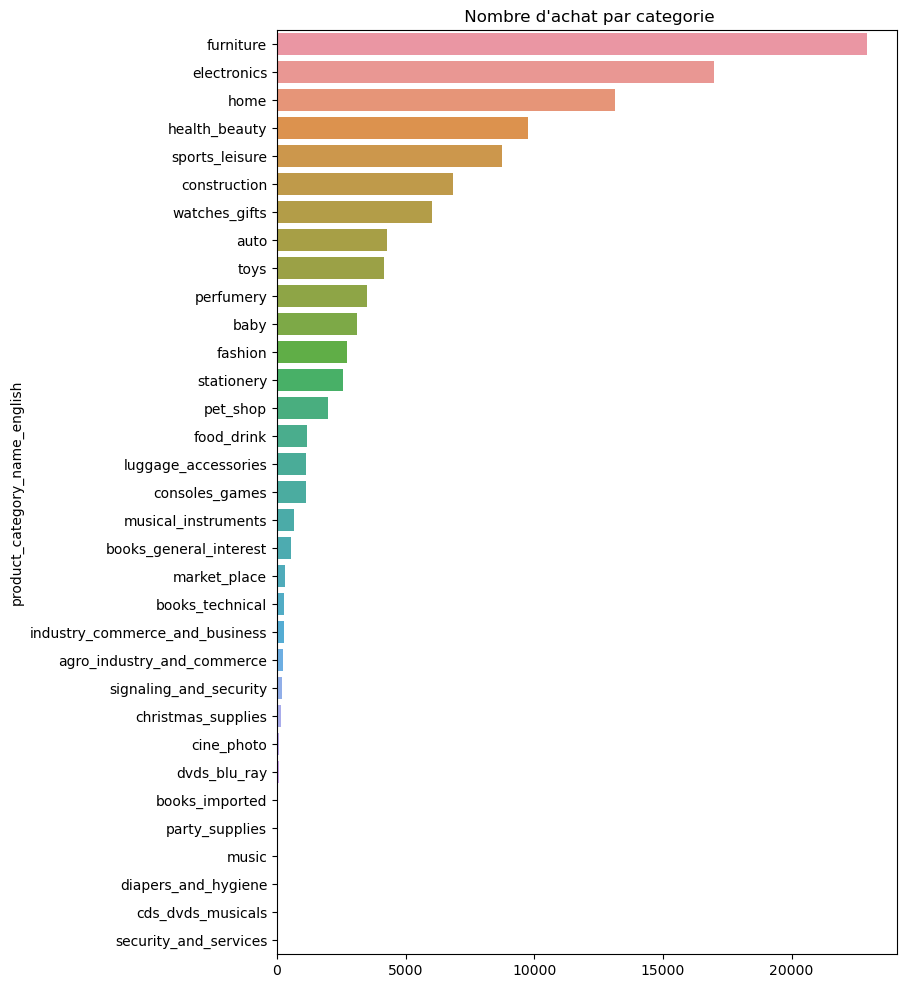

In [ ]:
product_type = df.groupby(['product_category_name_english']).count().sort_values(
    by='customer_id', ascending=False)['customer_id']
display(product_type)
plt.figure(figsize=(8,12))
plt.title(" Nombre d'achat par categorie")
sns.barplot(x = product_type.values,
           y = product_type.index)

### Nombres d'achat en fonction du mode de paiment

<Axes: title={'center': ' Mode de paiment'}, ylabel='payment_type'>

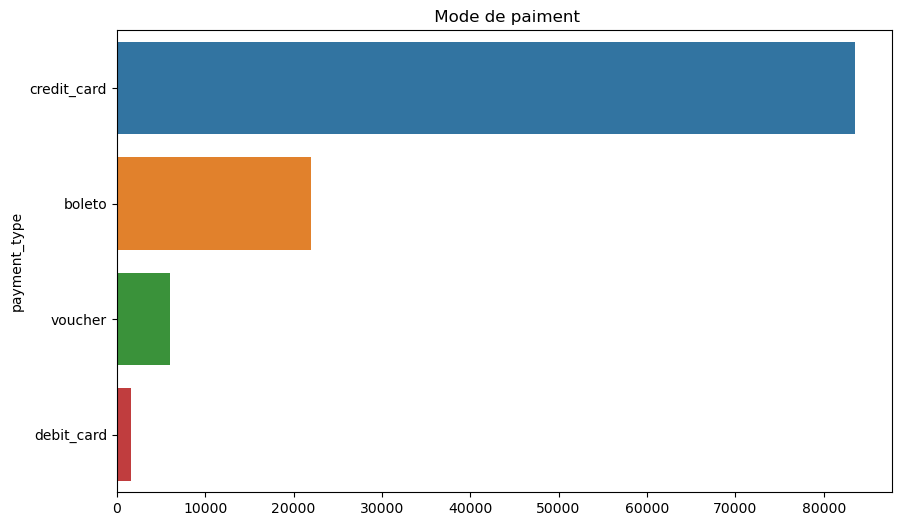

In [ ]:
payment_mode = df.groupby(['payment_type']).count().sort_values(
    by='customer_city', ascending=False)['customer_city'].head()
plt.figure(figsize=(10,6))
plt.title(' Mode de paiment')
sns.barplot(x = payment_mode.values,
           y = payment_mode.index)

boleto = billet

In [ ]:
display(df)
df_f = df_f.merge(Product_cat_df, on="product_category_name", how='left')
df_f = df_f.drop('product_category_name',axis=1)
df_f['last_purchase'] = df_f['last_purchase'].dt.days.astype(float)
display(df_f[:1])

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name_english,purchase_month_year
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,8577,itaquaquecetuba,SP,88b8b52d46df026a9d1ad2136a59b30b,4,nan,2017-05-26 00:00:00,2017-05-30 22:34:40,furniture,2017-05
1,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,...,8577,itaquaquecetuba,SP,5ad6695d76ee186dc473c42706984d87,5,nan,2018-06-15 00:00:00,2018-06-15 12:10:59,furniture,2018-05
2,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,...,8577,itaquaquecetuba,SP,059a801bb31f6aab2266e672cab87bc5,5,nan,2018-03-29 00:00:00,2018-04-02 18:36:47,furniture,2018-03
3,4c06b42fbf7b97ab10779cda5549cd1c,07d190f123147d9e89d4b922543d7948,65075,sao luis,MA,997fd4b37386d10b57d4ac8cdec011a6,delivered,2018-07-08 09:59:19,2018-07-08 10:30:15,2018-07-25 15:12:00,...,8577,itaquaquecetuba,SP,2518803238cabbf63564593e4a8fc52d,1,"Ainda nao recebi o produto. Sendo assim, nao p...",2018-08-09 00:00:00,2018-08-14 11:40:54,furniture,2018-07
4,8276de07ef25225d412b8462d73f8664,332cf4e83e16004ba7dca932ce82475b,90010,porto alegre,RS,b63fff1ef8b6201df68bb611ee41129e,delivered,2017-04-02 22:15:27,2017-04-04 05:55:19,2017-04-13 16:28:06,...,8577,itaquaquecetuba,SP,84467f1766775ba4c14fc25b3ca67905,4,"A critica e a entrega, pois por se tratar dos ...",2017-05-03 00:00:00,2017-05-03 21:06:33,furniture,2017-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117325,59168d27c5da6a50e3d1f03d482e80b2,393c2ace23a135d0bcc7e70167448e16,47800,barreiras,BA,c382d84d35f4d874b1f1c372f4bde27c,delivered,2018-07-20 09:42:40,2018-07-20 15:05:22,2018-07-23 11:53:00,...,40285,salvador,BA,ad5b887e12660a77a4e7f0b5130f36f3,5,"Otimo produto, entrega rapida, superou minhas ...",2018-07-28 00:00:00,2018-07-30 16:48:30,food_drink,2018-07
117327,eda10d7eb51a675d000956fa1aabc7dd,5c22dbb9d8b5385953f2f1e6d9d115a7,39920,jordania,MG,b494f624c631105b24fe497277085909,delivered,2018-08-01 18:58:49,2018-08-02 18:50:15,2018-08-03 15:39:00,...,87015,maringa,PR,709ee020ff826ee5289d7dd5d6911d0c,5,nan,2018-08-14 00:00:00,2018-08-15 11:31:29,pet_shop,2018-08
117329,b90b857a277b080d8078332b3636ab58,7f5f43a9394964ac51bc5d1e0204ead4,76400,uruacu,GO,d76fe905f4588ad69ab3b36527bb267d,delivered,2018-08-18 20:59:58,2018-08-18 21:10:13,2018-08-20 16:49:00,...,83015,sao jose dos pinhais,PR,6010e1ba95a9e19dc10a7b761932cf98,5,nan,2018-08-29 00:00:00,2018-08-29 21:43:39,construction,2018-08
117330,1ed0c832c2dd99570a59260e71768bdf,82d46759af0369aad49084bacf85a6c3,37610,bom repouso,MG,51c6d2f460589fa7b65f2da51e860206,delivered,2017-11-14 12:04:09,2017-11-14 12:15:25,2017-11-27 20:44:47,...,12914,braganca paulista,SP,603f2873842a6975a43c54d305397d69,1,nan,2017-12-14 00:00:00,2017-12-16 13:50:11,electronics,2017-11


,customer_unique_id,customer_id,achat_moy,total_purchase_value,note,payment_type,customer_city,customer_state,order_purchase_timestamp,last_purchase,product_category_name_english
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.9,129.9,5.0,credit_card,cajamar,SP,2018-05-10 10:56:27,111.0,bed_bath_table


In [ ]:
# Nombre de client qui ont effectuer plus de 5 achat
max_item = df_f.loc[df_f['customer_id'] > 5]
display(max_item.shape)


(526, 11)

In [ ]:
display(df_f[:15])

,customer_unique_id,customer_id,achat_moy,total_purchase_value,note,payment_type,customer_city,customer_state,order_purchase_timestamp,last_purchase,product_category_name_english
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,129.90,5.0,credit_card,cajamar,SP,2018-05-10 10:56:27,111.0,bed_bath_table
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,18.90,4.0,credit_card,osasco,SP,2018-05-07 11:11:27,114.0,health_beauty
2,0000f46a3911fa3c0805444483337064,1,69.00,69.00,3.0,credit_card,sao jose,SC,2017-03-10 21:05:03,536.0,stationery
3,0000f6ccb0745a6a4b88665a16c9f078,1,25.99,25.99,4.0,credit_card,belem,PA,2017-10-12 20:29:41,320.0,telephony
4,0004aac84e0df4da2b147fca70cf8255,1,180.00,180.00,5.0,credit_card,sorocaba,SP,2017-11-14 19:45:42,287.0,telephony
5,0004bd2a26a76fe21f786e4fbd80607f,1,154.00,154.00,4.0,credit_card,sao paulo,SP,2018-04-05 19:33:16,145.0,garden_tools
6,00050ab1314c0e55a6ca13cf7181fecf,1,27.99,27.99,4.0,boleto,campinas,SP,2018-04-20 12:57:23,131.0,telephony
7,00053a61a98854899e70ed204dd4bafe,2,191.00,382.00,1.0,credit_card,curitiba,PR,2018-02-28 11:15:41,182.0,sports_leisure
8,0005e1862207bf6ccc02e4228effd9a0,1,135.00,135.00,4.0,credit_card,teresopolis,RJ,2017-03-04 23:32:12,542.0,fashion_bags_accessories
9,0005ef4cd20d2893f0d9fbd94d3c0d97,1,104.90,104.90,1.0,credit_card,sao luis,MA,2018-03-12 15:22:12,169.0,sports_leisure


In [ ]:
# Exportation du DataFrame pour la modelisation
df_f.to_csv('/Users/bahia/Desktop/MLE_P4/Data/df_f.csv', index=False)